# Постановка задачи

## 1. Реализовать персональный топ  - принимает на вход возраст и локацию, на выходе персональный топ   - 1 балл

Персональный топ - это топ товаров по похожим возрасту/интересам/локации. Как сделать? Разбить на сегменты по выбраным признакам. Топ делать по книгам с хорошим средним рейтингом.

## 2. На основе метода кластеризации похожих пользователей построить рекомендации - 3 балла

Нужно топ-10 рекомендаций с самой высокой оценкой. Считаем среднюю оценку для каждой книги по кластеру и выводим топ-10 книг.


## 3. Совстречаемость - 3 балла

В совстречаемости также учитывать оценки. Вес пары книг встретившихся у пользователя - полусумма их оценок.


## 4. Коллаборативная фильтрация - 3 балла

Коллаборативную фильтрацию реализовывать как на слайде 51 презентации, посоветовав каждому пользователю топ-10 книг с самой высокой оценкой. Сделать рекомендации User-based и Item-based и сравнить.

Если совсем сложно - можно сделать как в семинарской части, поставив оценку "0", если рейтинг < 5 и "1" - в противном случае. Тогда максимум за это - 1 балл. Реализовать U2I и I2I рекомендации.

## Примечание:

Так как пользователей много - можно зафиксировать несколько произвольных и для них уже составлять рекомендации

Работоспособность I2I можно проверять на известных книгах (Гарри Поттер, Властелин Колец, Интервью с вампиром, Код-Да-Винчи, Маленький Принц)

Рейтинг книг обязательно нужно учитывать

Не забываем также предобработать данные - выкинуть выбросы-пользователей и выбросы-книги.

## pip

In [2]:
!pip install pandas numpy seaborn matplotlib scipy scikit-learn xgboost catboost progressbar2 requests

## import

In [24]:
import re
import numpy as np
import pandas as pd
from io import BytesIO
from PIL import Image
import requests
from scipy.sparse import csr_matrix
from sklearn.metrics.pairwise import cosine_similarity
from collections import Counter
import matplotlib.pyplot as plt
from scipy.sparse import coo_matrix
from sklearn import preprocessing
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

# Работа с данными

## Извлечение данных

In [4]:
!gzip -dk BX-Books.csv.gz
!gzip -dk BX-Book-Ratings.csv.gz
!gzip -dk BX-Users.csv.gz

In [5]:
books = pd.read_csv("BX-Books.csv")
books

/var/folders/ll/sf8djrcj0ljd5cltbywtgm9w0000gn/T/ipykernel_56195/612692336.py:1: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  books = pd.read_csv("BX-Books.csv")


,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...
...,...,...,...,...,...,...,...,...
271355,0440400988,There's a Bat in Bunk Five,Paula Danziger,1988,Random House Childrens Pub (Mm),http://images.amazon.com/images/P/0440400988.0...,http://images.amazon.com/images/P/0440400988.0...,http://images.amazon.com/images/P/0440400988.0...
271356,0525447644,From One to One Hundred,Teri Sloat,1991,Dutton Books,http://images.amazon.com/images/P/0525447644.0...,http://images.amazon.com/images/P/0525447644.0...,http://images.amazon.com/images/P/0525447644.0...
271357,006008667X,Lily Dale : The True Story of the Town that Ta...,Christine Wicker,2004,HarperSanFrancisco,http://images.amazon.com/images/P/006008667X.0...,http://images.amazon.com/images/P/006008667X.0...,http://images.amazon.com/images/P/006008667X.0...
271358,0192126040,Republic (World's Classics),Plato,1996,Oxford University Press,http://images.amazon.com/images/P/0192126040.0...,http://images.amazon.com/images/P/0192126040.0...,http://images.amazon.com/images/P/0192126040.0...


In [6]:
interactions = pd.read_csv("BX-Book-Ratings.csv", sep=";", encoding = "ISO-8859-1")

In [7]:
interactions = interactions[interactions["Book-Rating"] != 0]
interactions

,User-ID,ISBN,Book-Rating
1,276726,0155061224,5
3,276729,052165615X,3
4,276729,0521795028,6
6,276736,3257224281,8
7,276737,0600570967,6
...,...,...,...
1149773,276704,0806917695,5
1149775,276704,1563526298,9
1149777,276709,0515107662,10
1149778,276721,0590442449,10


## Анализ данных

In [8]:
books_meets = interactions.groupby("ISBN")["User-ID"].count().reset_index().rename(columns={"User-ID": "user_num"})

In [9]:
user_meets = interactions.groupby("User-ID")["ISBN"].count().reset_index().rename(columns={"ISBN": "books_num"})

In [10]:
interactions = interactions.merge(books_meets, on=["ISBN"]).merge(user_meets, on=["User-ID"])

In [11]:
interactions = interactions[(interactions["user_num"] > 5) &
                            (interactions["books_num"] > 5) &
                            (interactions["books_num"] < 200)]

In [66]:
users = pd.read_csv('BX-Users.csv', delimiter=';', encoding = 'ISO-8859-1')
users

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN
...,...,...,...
278853,278854,"portland, oregon, usa",NaN
278854,278855,"tacoma, washington, united kingdom",50.0
278855,278856,"brampton, ontario, canada",NaN
278856,278857,"knoxville, tennessee, usa",NaN


In [13]:
interactions = interactions.merge(books[["ISBN", "Image-URL-M", "Book-Title"]].rename(
    columns={"Image-URL-M": "picture_url"}), on=["ISBN"])

## Вывод Id

In [14]:
le = preprocessing.LabelEncoder()

In [15]:
interactions["product_id"] = le.fit_transform(interactions["ISBN"])
interactions["vid"] = le.fit_transform(interactions["User-ID"])

In [16]:
interactions.head()

,User-ID,ISBN,Book-Rating,user_num,books_num,picture_url,Book-Title,product_id,vid
0,276822,0060096195,10,53,15,http://images.amazon.com/images/P/0060096195.0...,The Boy Next Door,98,10883
1,276822,0375821813,9,10,15,http://images.amazon.com/images/P/0375821813.0...,Hoot (Newbery Honor Book),2737,10883
2,276822,0786817070,10,74,15,http://images.amazon.com/images/P/0786817070.0...,"Artemis Fowl (Artemis Fowl, Book 1)",8884,10883
3,276847,3404148576,8,10,36,http://images.amazon.com/images/P/3404148576.0...,Nordermoor,10402,10884
4,276847,3423071516,10,13,36,http://images.amazon.com/images/P/3423071516.0...,Der Kleine Hobbit,10409,10884


In [17]:
for i, j in interactions[["product_id", "Book-Title"]].drop_duplicates().values:
    if "Harry Potter" in j:
        print("idx:", i, "\tBook Title:", j)

idx: 10573 	Book Title: Harry Potter und der Stein der Weisen
idx: 10574 	Book Title: Harry Potter und die Kammer des Schreckens
idx: 10575 	Book Title: Harry Potter und der Gefangene von Azkaban
idx: 10576 	Book Title: Harry Potter Und Der Feuerkelch
idx: 4217 	Book Title: Harry Potter and the Chamber of Secrets (Book 2)
idx: 4225 	Book Title: Harry Potter and the Prisoner of Azkaban (Book 3)
idx: 4227 	Book Title: Harry Potter and the Goblet of Fire (Book 4)
idx: 4233 	Book Title: Harry Potter and the Order of the Phoenix (Book 5)
idx: 7036 	Book Title: Harry Potter and the Sorcerer's Stone (Harry Potter (Paperback))
idx: 4216 	Book Title: Harry Potter and the Chamber of Secrets (Book 2)
idx: 4224 	Book Title: Harry Potter and the Prisoner of Azkaban (Book 3)
idx: 4226 	Book Title: Harry Potter and the Goblet of Fire (Book 4)
idx: 7035 	Book Title: Harry Potter and the Sorcerer's Stone (Book 1)
idx: 10662 	Book Title: Harry Potter y la piedra filosofal
idx: 10663 	Book Title: Harry P

# Решение

## Простой топ

### Преобработка

In [67]:
users = users.loc[(users.Age >= 10) & (users.Age <= 80)]
users

,User-ID,Location,Age
1,2,"stockton, california, usa",18.0
3,4,"porto, v.n.gaia, portugal",17.0
5,6,"santa monica, california, usa",61.0
9,10,"albacete, wisconsin, spain",26.0
10,11,"melbourne, victoria, australia",14.0
...,...,...,...
278848,278849,"georgetown, ontario, canada",23.0
278850,278851,"dallas, texas, usa",33.0
278851,278852,"brisbane, queensland, australia",32.0
278852,278853,"stranraer, n/a, united kingdom",17.0


In [68]:
users = users.loc[users['Location'].apply(lambda x: x.count(',')) == 2]
users

,User-ID,Location,Age
1,2,"stockton, california, usa",18.0
3,4,"porto, v.n.gaia, portugal",17.0
5,6,"santa monica, california, usa",61.0
9,10,"albacete, wisconsin, spain",26.0
10,11,"melbourne, victoria, australia",14.0
...,...,...,...
278848,278849,"georgetown, ontario, canada",23.0
278850,278851,"dallas, texas, usa",33.0
278851,278852,"brisbane, queensland, australia",32.0
278852,278853,"stranraer, n/a, united kingdom",17.0


In [69]:
users.Location = users.Location.apply(lambda x: re.sub(r"[^A-Za-z,]+", '', x))
users

/var/folders/ll/sf8djrcj0ljd5cltbywtgm9w0000gn/T/ipykernel_56195/1004525036.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  users.Location = users.Location.apply(lambda x: re.sub(r"[^A-Za-z,]+", '', x))


,User-ID,Location,Age
1,2,"stockton,california,usa",18.0
3,4,"porto,vngaia,portugal",17.0
5,6,"santamonica,california,usa",61.0
9,10,"albacete,wisconsin,spain",26.0
10,11,"melbourne,victoria,australia",14.0
...,...,...,...
278848,278849,"georgetown,ontario,canada",23.0
278850,278851,"dallas,texas,usa",33.0
278851,278852,"brisbane,queensland,australia",32.0
278852,278853,"stranraer,na,unitedkingdom",17.0


In [70]:
city = []
state = []
country = []
for location in users['Location'].str.replace(" ",""):
    buffer = location.split(",")
    city.append(buffer[0])
    state.append(buffer[1])
    country.append(buffer[2])
users = users.assign(City=city, State=state, Country=country)
users

,User-ID,Location,Age,City,State,Country
1,2,"stockton,california,usa",18.0,stockton,california,usa
3,4,"porto,vngaia,portugal",17.0,porto,vngaia,portugal
5,6,"santamonica,california,usa",61.0,santamonica,california,usa
9,10,"albacete,wisconsin,spain",26.0,albacete,wisconsin,spain
10,11,"melbourne,victoria,australia",14.0,melbourne,victoria,australia
...,...,...,...,...,...,...
278848,278849,"georgetown,ontario,canada",23.0,georgetown,ontario,canada
278850,278851,"dallas,texas,usa",33.0,dallas,texas,usa
278851,278852,"brisbane,queensland,australia",32.0,brisbane,queensland,australia
278852,278853,"stranraer,na,unitedkingdom",17.0,stranraer,na,unitedkingdom


In [71]:
users.drop(columns='Location', inplace=True)
users

,User-ID,Age,City,State,Country
1,2,18.0,stockton,california,usa
3,4,17.0,porto,vngaia,portugal
5,6,61.0,santamonica,california,usa
9,10,26.0,albacete,wisconsin,spain
10,11,14.0,melbourne,victoria,australia
...,...,...,...,...,...
278848,278849,23.0,georgetown,ontario,canada
278850,278851,33.0,dallas,texas,usa
278851,278852,32.0,brisbane,queensland,australia
278852,278853,17.0,stranraer,na,unitedkingdom


### Кластеризация

In [72]:
groups = pd.DataFrame({'group': ['Child', 'Youth', 'Adult', 'Senior'],
                           'start': [0., 15., 25., 65.],
                           'end': [14., 24., 64., 101.]})

In [73]:
def get_group(age):
    return groups.loc[(groups.start <= age) & (groups.end >= age), 'group'].iloc[0]

In [74]:
users.Age = users.Age.apply(get_group)
clusters = users[['Age', 'Country']].drop_duplicates().reset_index(drop=True)
clusters

,Age,Country
0,Youth,usa
1,Youth,portugal
2,Adult,usa
3,Adult,spain
4,Child,australia
...,...,...
599,Youth,libya
600,Adult,macau
601,Youth,palau
602,Adult,libya


### Рекомендация

In [75]:
def chunks(l, n):
    for i in range(0, len(l), n):
        yield l[i:i + n]

In [76]:
def rec_imaging(data, measure=None, top_n=5):
    picture_urls = data.picture_url.values
    cnt = 0
    for idx, chunk in enumerate(chunks(picture_urls, top_n)):
        fig = plt.figure(figsize=(20, 4))
        for n, i in enumerate(chunk):
            try:
                headers = {'User-Agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/16.5 Safari/605.1.15'}
                r = requests.get(i, headers=headers)
                im = Image.open(BytesIO(r.content))

            except:
                print('Something went wrong with {url}'.format(url=i))
                continue

            a = fig.add_subplot(1, top_n, n + 1)
            if measure is not None:
                a.title.set_text("measure = {}".format(np.round(measure[cnt], 4)))
                cnt += 1
            plt.imshow(im)
            plt.axis('off')
        plt.show()

In [77]:
headers = {'User-Agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/16.5 Safari/605.1.15'}
r = requests.get("http://images.amazon.com/images/P/0836217179.01.MZZZZZZZ.jpg", headers=headers)
r

<Response [200]>

In [78]:
class Top():
    def __init__(self, clusters, users=users, data=interactions, ages=groups, countries=clusters.Country.unique()):
        self.clusters = clusters
        self.users = users
        self.data = data
        self.ages = ages
        self.countries = countries

    def get_book_score(self, data):
        tmp = data.groupby(by=['user_num', 'Book-Title'])['Book-Rating'].mean().reset_index()
        tmp = pd.merge(tmp, data[['Book-Title', 'picture_url']].drop_duplicates(subset='Book-Title'), how='inner', on='Book-Title')
        tmp = tmp.assign(score = tmp["Book-Rating"].mean()).sort_values(by='score', ascending=False)
        return tmp

    def top_items(self, country, age, top_count=10):
        country = country if country in self.countries else 'others'
        age = self.ages.loc[(self.ages.start <= age) & (self.ages.end >= age), 'group'].iloc[0]
        if self.clusters.loc[(self.clusters.Age == age) & (self.clusters.Country == country)].shape[0] == 0:
            print("Sorry, we can't find people like you")
            return
        suitable_users = self.users.loc[(self.users.Age == age) & (self.users.Country == country), 'User-ID']
        suitable_data = pd.merge(self.data, suitable_users, how='inner', on='User-ID')
        book_score = self.get_book_score(suitable_data)
        if book_score.shape[0] == 0:
            print("Sorry, but we don't have recommendation for you")
            return
        rec_imaging(book_score[:top_count])
        return book_score

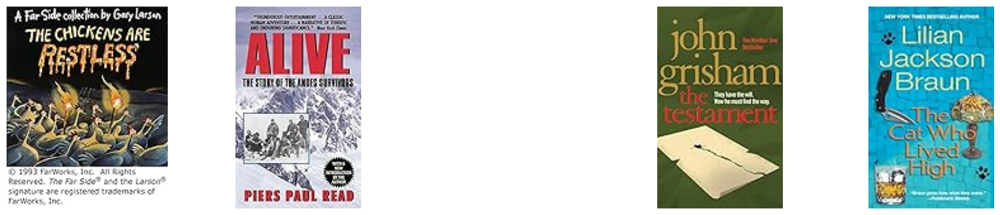

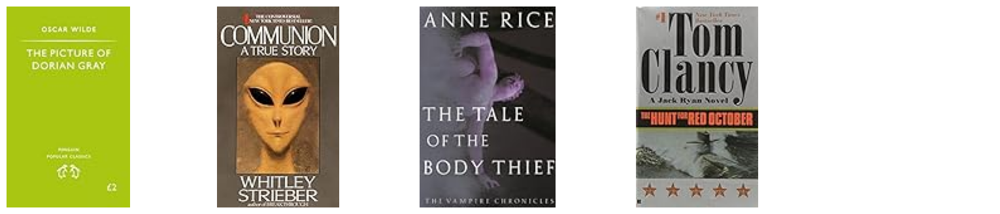

,user_num,Book-Title,Book-Rating,picture_url,score
0,6,Chickens Are Restless (Far Side Series),10.0,http://images.amazon.com/images/P/0836217179.0...,7.978992
75,22,Alive : The Story of the Andes Survivors (Avon...,8.0,http://images.amazon.com/images/P/038000321X.0...,7.978992
87,39,Thinner,8.0,http://images.amazon.com/images/P/0451137965.0...,7.978992
86,35,The Testament,7.0,http://images.amazon.com/images/P/0099245027.0...,7.978992
85,29,The Cat Who Lived High,6.0,http://images.amazon.com/images/P/051510566X.0...,7.978992
...,...,...,...,...,...
35,12,Northanger Abbey (Penguin Popular Classics),7.0,http://images.amazon.com/images/P/0140620753.0...,7.978992
34,11,Wildlife Preserves,10.0,http://images.amazon.com/images/P/0836218426.0...,7.978992
33,11,Satanic Bible,9.0,http://images.amazon.com/images/P/0380015390.0...,7.978992
32,11,My Forbidden Face: Growing Up Under the Taliba...,10.0,http://images.amazon.com/images/P/0786869011.0...,7.978992


In [79]:
top = Top(clusters)
top.top_items('italy', 35.)

## Дерево рекомендаций на основе кластеризации похожих пользователей

In [80]:
csr_interactions = coo_matrix((interactions["Book-Rating"], (interactions["vid"], interactions["product_id"])),
                            shape=(len(set(interactions["vid"])), len(set(interactions["product_id"]))))

In [84]:
def find_eps(df):
    m = NearestNeighbors(n_neighbors=3, metric='cosine')
    res = m.fit(df)
    dist, i = res.kneighbors(df)
    dist = np.sort(dist, axis=0)
    dist = dist[:,1]
    plt.plot(dist)
    plt.grid()
    plt.show()

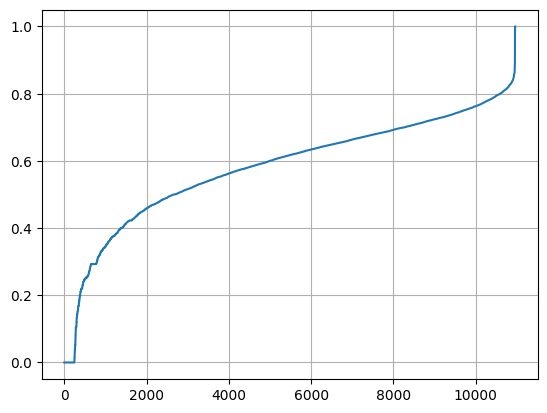

In [85]:
find_eps(csr_interactions)

In [86]:
dbscan = DBSCAN(eps=0.65, min_samples=2, metric='cosine')
dbscan.fit(csr_interactions)
labels = dbscan.labels_
np.unique(labels).shape[0]

285

In [87]:
class Clustering():
    def __init__(self, data=interactions):
        self.data = data

    def get_book_score(self, data):
        tmp = data.groupby(by=['user_num', 'Book-Title'])['Book-Rating'].mean().reset_index()
        tmp = pd.merge(tmp, data[['Book-Title', 'picture_url']].drop_duplicates(subset='Book-Title'), how='inner', on='Book-Title')
        tmp = tmp.assign(score = tmp["Book-Rating"].mean()).sort_values(by='score', ascending=False)
        return tmp

    def top_items(self, users, top_count=10):
        suitable_data = interactions.loc[interactions['vid'].isin(users)]
        book_score = self.get_book_score(suitable_data)
        if book_score.shape[0] == 0:
            print("Sorry, but we don't have suitable recommendation for you")
            return
        rec_imaging(book_score[:top_count])
        return book_score

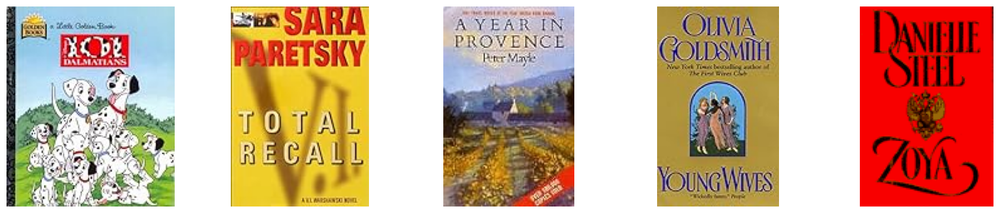

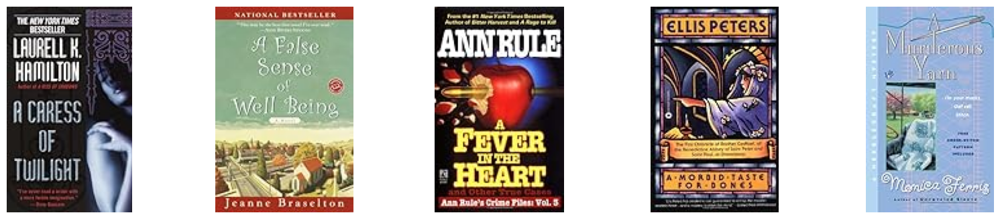

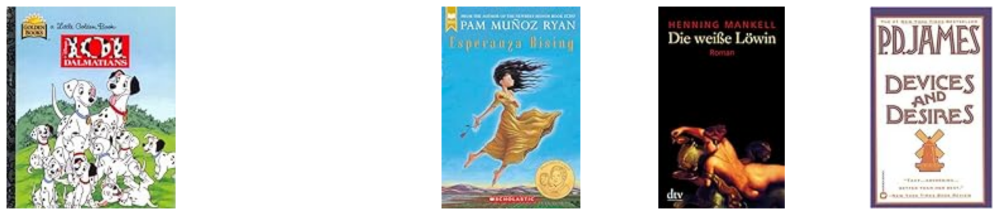

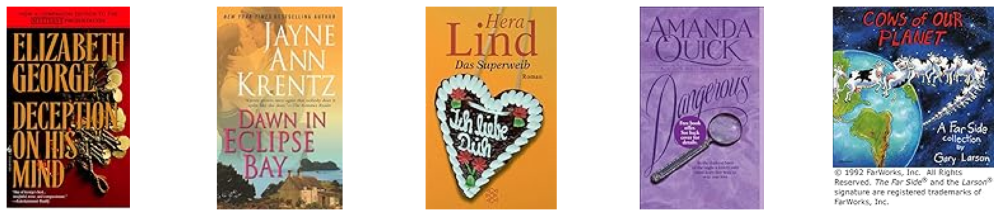

In [88]:
for clust in [-1, 0]:
    Clustering().top_items(users=np.where(labels == clust)[0])

## Совстречаемость

In [89]:
interactions

,User-ID,ISBN,Book-Rating,user_num,books_num,picture_url,Book-Title,product_id,vid
0,276822,0060096195,10,53,15,http://images.amazon.com/images/P/0060096195.0...,The Boy Next Door,98,10883
1,276822,0375821813,9,10,15,http://images.amazon.com/images/P/0375821813.0...,Hoot (Newbery Honor Book),2737,10883
2,276822,0786817070,10,74,15,http://images.amazon.com/images/P/0786817070.0...,"Artemis Fowl (Artemis Fowl, Book 1)",8884,10883
3,276847,3404148576,8,10,36,http://images.amazon.com/images/P/3404148576.0...,Nordermoor,10402,10884
4,276847,3423071516,10,13,36,http://images.amazon.com/images/P/3423071516.0...,Der Kleine Hobbit,10409,10884
...,...,...,...,...,...,...,...,...,...
110514,276688,0553575104,6,20,29,http://images.amazon.com/images/P/0553575104.0...,In Pursuit of the Proper Sinner,6832,10882
110515,276688,0688156134,8,16,29,http://images.amazon.com/images/P/0688156134.0...,Stalker: A Novel (Peter Decker &amp; Rina Laza...,8355,10882
110516,276688,0743202694,10,9,29,http://images.amazon.com/images/P/0743202694.0...,"Money, Money, Money : A Novel of the 87th Prec...",8445,10882
110517,276688,0836218655,10,23,29,http://images.amazon.com/images/P/0836218655.0...,Wiener Dog Art,9388,10882


In [90]:
class Recomendations():
    def __init__(self, Int=interactions):
        self.book_scores = Int.groupby(by='Book-Title')['Book-Rating'].mean().reset_index()
        self.book_scores = pd.merge(self.book_scores, Int[['Book-Title', 'picture_url']].drop_duplicates(subset='Book-Title'), how='inner', on='Book-Title')
        self.int = Int

    def get_rec(self, title, top_count=10):
        good_int = self.int.loc[self.int['Book-Title'].eq(title), 'vid']
        cnt = Counter()
        for coop in self.int.loc[(self.int.vid.isin(good_int)) & (self.int['Book-Title'] != title), 'Book-Title']:
            cnt[coop] += 1
        if len(cnt) == 0:
            print("Sorry, but we don't have recommendation for people like you")
            return
        cnt = pd.DataFrame.from_dict(cnt, orient='index').reset_index().rename(columns={'index': 'Book-Title', 0: 'Counter'})

        data = pd.merge(self.book_scores, cnt, how='inner', on='Book-Title')
        data = data.sort_values(by=['Counter', 'Book-Rating'], ascending=False)
        rec_imaging(data[:top_count])

        return data

In [91]:
recs = Recomendations()

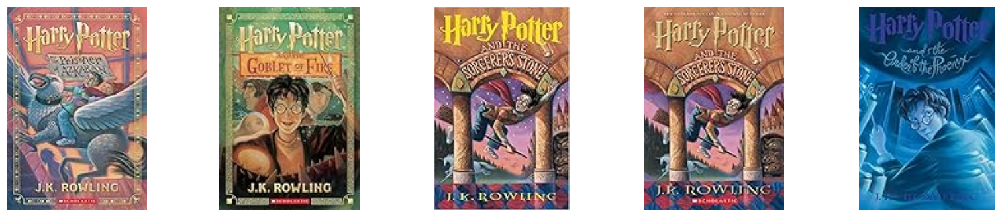

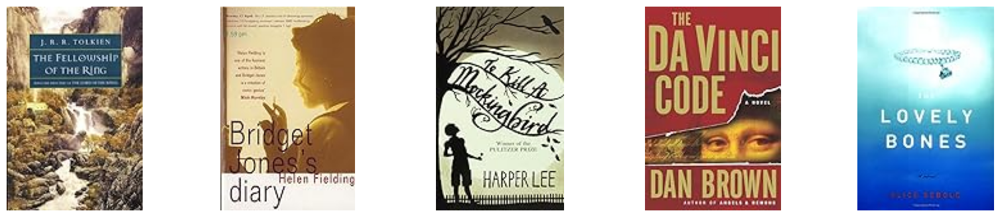

,Book-Title,Book-Rating,picture_url,Counter
1040,Harry Potter and the Prisoner of Azkaban (Book 3),9.059406,http://images.amazon.com/images/P/0439136369.0...,128
1038,Harry Potter and the Goblet of Fire (Book 4),9.198895,http://images.amazon.com/images/P/0439139600.0...,114
1042,Harry Potter and the Sorcerer's Stone (Book 1),9.076923,http://images.amazon.com/images/P/0590353403.0...,73
1043,Harry Potter and the Sorcerer's Stone (Harry P...,8.979275,http://images.amazon.com/images/P/059035342X.0...,71
1039,Harry Potter and the Order of the Phoenix (Boo...,9.122449,http://images.amazon.com/images/P/043935806X.0...,66
...,...,...,...,...
421,Candide (Dover Thrift Editions),5.000000,http://images.amazon.com/images/P/0486266893.0...,1
27,A Calculated Risk,4.857143,http://images.amazon.com/images/P/0345386825.0...,1
1013,Ground Zero and Beyond,4.625000,http://images.amazon.com/images/P/1401088945.0...,1
2654,The Last Girls (Ballantine Reader's Circle),4.600000,http://images.amazon.com/images/P/0345464958.0...,1


In [92]:
recs.get_rec('Harry Potter and the Chamber of Secrets (Book 2)')

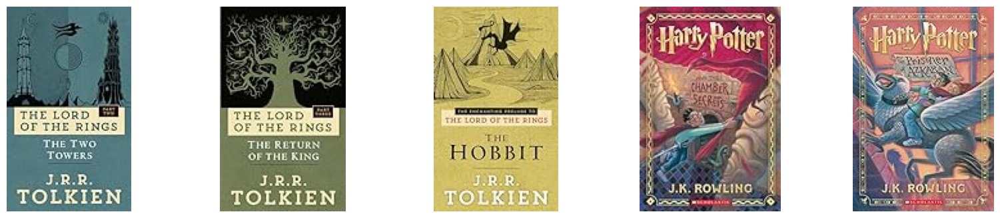

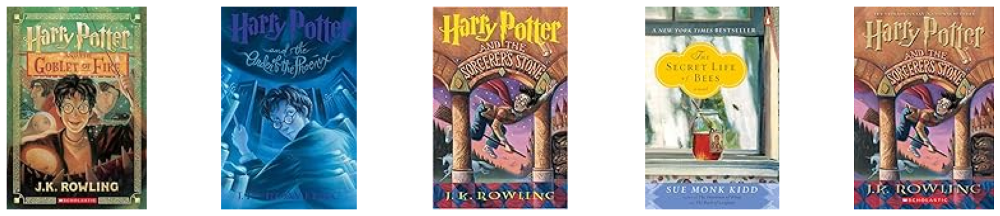

,Book-Title,Book-Rating,picture_url,Counter
1751,"The Two Towers (The Lord of the Rings, Part 2)",9.385542,http://images.amazon.com/images/P/0345339711.0...,50
1666,"The Return of the King (The Lord of the Rings,...",9.561404,http://images.amazon.com/images/P/0345339738.0...,36
1506,The Hobbit : The Enchanting Prelude to The Lor...,8.838384,http://images.amazon.com/images/P/0345339681.0...,29
625,Harry Potter and the Chamber of Secrets (Book 2),8.891213,http://images.amazon.com/images/P/0439064872.0...,27
629,Harry Potter and the Prisoner of Azkaban (Book 3),9.059406,http://images.amazon.com/images/P/0439136369.0...,25
...,...,...,...,...
19,A Calculated Risk,4.857143,http://images.amazon.com/images/P/0345386825.0...,1
688,I Will Fear No Evil,4.818182,http://images.amazon.com/images/P/0441359175.0...,1
1670,The Road Ahead (CD ROM included),4.666667,http://images.amazon.com/images/P/0140260404.0...,1
610,Ground Zero and Beyond,4.625000,http://images.amazon.com/images/P/1401088945.0...,1


In [93]:
recs.get_rec('The Fellowship of the Ring (The Lord of the Rings, Part 1)')

## Коллаборативная фильтрация

In [94]:
def chunks(l, n):
    for i in range(0, len(l), n):
        yield l[i:i + n]

In [95]:
def rec_imaging(product_ids, content_dict, measure=None, top_n=5):
    picture_urls = [content_dict[i] for i in product_ids]
    cnt = 0
    for idx, chunk in enumerate(chunks(picture_urls, top_n)):
        fig = plt.figure(figsize=(20, 4))
        for n, i in enumerate(chunk):
            try:
                headers = {'User-Agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/16.5 Safari/605.1.15'}
                r = requests.get(i, headers=headers)
                im = Image.open(BytesIO(r.content))

            except:
                print('Something went wrong with {url}'.format(url=i))
                continue

            a = fig.add_subplot(1, top_n, n + 1)
            if measure is not None:
                a.title.set_text("measure = {}".format(np.round(measure[cnt], 4)))
                cnt += 1
            plt.imshow(im)
            plt.axis('off')
        plt.show()

In [97]:
class Colloborative():
    def __init__(self, interactions):
        self.content_dict = {}
        for i, j in interactions[["product_id", "picture_url"]].drop_duplicates().values:
            self.content_dict[int(i)] = j
        self.csr_int = coo_matrix((interactions["Book-Rating"], (interactions["vid"], interactions["product_id"])),
                                  shape=(len(set(interactions["vid"])), len(set(interactions["product_id"]))))


    def user_based(self, idx):
        user_rates = self.csr_int.getrow(idx).toarray()[0]
        watched_items = np.where(user_rates != 0)[0]
        metrics = cosine_similarity([user_rates], self.csr_int).reshape(-1, 1)
        rates = csr_matrix.multiply(self.csr_int.copy(), metrics)
        total_rate = (1 - user_rates.astype(bool)) * np.array(np.sum(rates, axis=0))[0]
        self.get_rec(watched_items, np.arange(self.csr_int.shape[1])[np.argsort(total_rate)[::-1][:10]],
                    np.sort(total_rate)[::-1][:10])

    def item_based(self, idx):
        item_rates = self.csr_int.getcol(idx).toarray().reshape(1, -1)
        metrics = cosine_similarity(item_rates, self.csr_int.T).reshape(-1, 1)
        rates = csr_matrix.multiply(self.csr_int.T.copy(), metrics)
        total_rate = np.array(np.sum(rates, axis=1)).ravel()
        self.get_rec([idx], np.arange(self.csr_int.shape[1])[np.argsort(total_rate)[::-1][:10]],
                    np.sort(total_rate)[::-1][:10])

    def get_rec(self, watched, recs, measure):
        print(u"Для таких товаров")
        rec_imaging([i for i in watched], self.content_dict)
        print(u"Такие рекомендации")
        rec_imaging([i for i in recs], self.content_dict, measure)

In [98]:
clb = Colloborative(interactions)

Для таких товаров


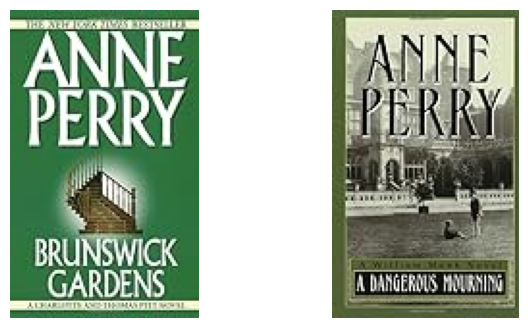

Такие рекомендации


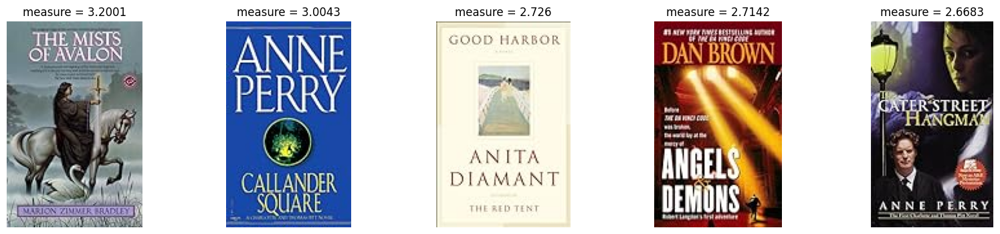

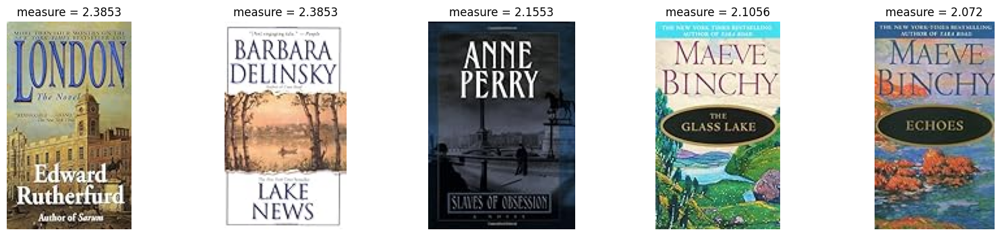

In [99]:
clb.user_based(85)

Для таких товаров


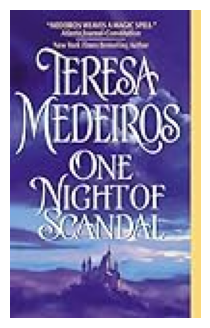

Такие рекомендации


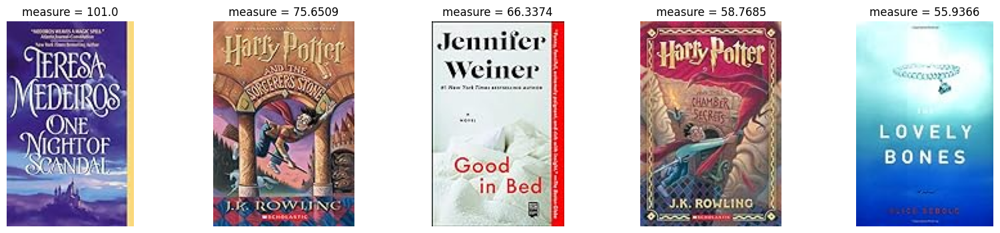

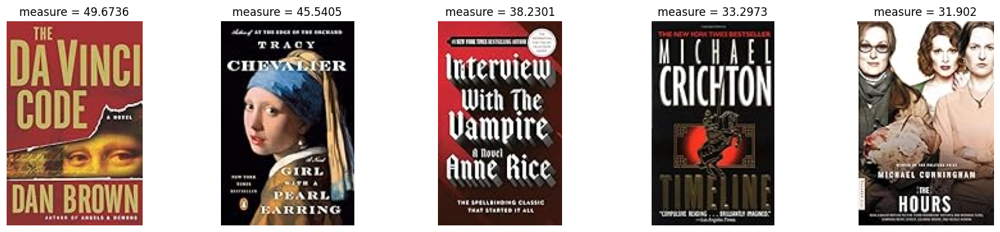

In [100]:
clb.item_based(234)

# Вывод

Код Да Винчи надо будет прочитать